In [1]:
#import sys
#!{sys.executable} -m pip install pandas-profiling

In [2]:
import numpy as np       # Implemennts milti-dimensional array and matrices
import pandas as pd      # For data manipulation and analysis
import ydata_profiling
import matplotlib.pyplot as plt  # Plotting 
import seaborn as sns    # Provides a high level interface for drawing attractive and informative statistical graphics
%matplotlib inline
sns.set(style='white')

from subprocess import check_output

from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import LabelEncoder 
from sklearn.preprocessing import MinMaxScaler

In [3]:
data = pd.read_csv("Titanic-Dataset.csv")  
print(data.info())
print(data.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB
None
   PassengerId  Survived  Pclass  \
0            1         0       3   
1            2         1       1   
2            3         1       3   
3            4         1       1   
4            5         0       3   

                      

In [4]:
# count missing data
data.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

In [5]:
df = data[["Survived", "Pclass", "Sex", "Age", "Fare"]]
# removed Embarked as it decresed model prediction

In [6]:
# Data manipulation 
#df.loc[df['Embarked'].isnull(),'Embarked'] = df['Embarked'].mode()[0]

In [7]:
df.loc[df['Age'].isnull(),'Age'] = df['Age'].mean()
#median gives lower prediction

In [8]:
print(df.isnull().sum())
print(df.shape)

Survived    0
Pclass      0
Sex         0
Age         0
Fare        0
dtype: int64
(891, 5)


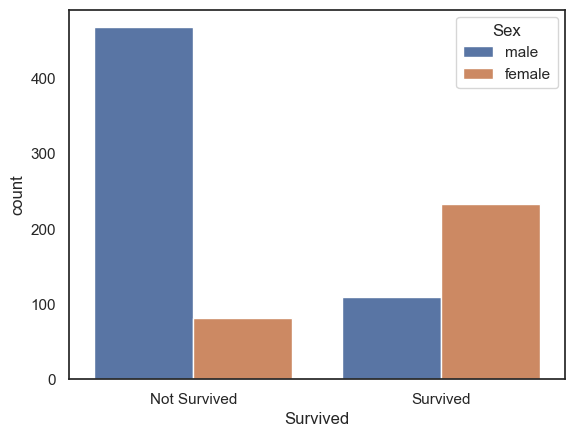

In [9]:
# Plot gender and Survived
sns.countplot(x = "Survived", data = df, hue = "Sex")
plt.xticks([0,1],["Not Survived", "Survived"])
plt.show()

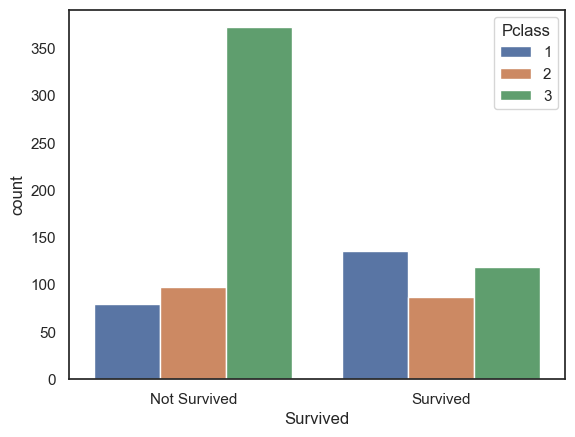

In [10]:
# Plot Pclass and Survived
sns.countplot(x = "Survived", data = df, hue = "Pclass")
plt.xticks([0,1],["Not Survived", "Survived"])
plt.show()

<AxesSubplot:>

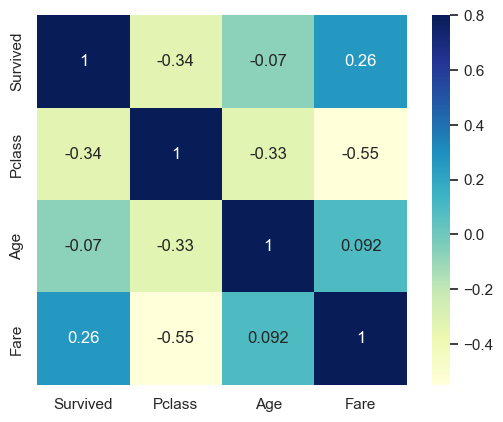

In [11]:
# correlation plot
sns.heatmap(df.corr(), annot = True, vmax=.8, square = True, cmap='YlGnBu', linecolor ='black')

In [12]:
# Encode categorical data 
lbl = LabelEncoder()
df_lbl = df.copy()
df_lbl.loc[:, 'Sex'] = lbl.fit_transform(df_lbl.loc[:, 'Sex'])
#df_lbl.loc[:, 'Embarked'] = lbl.fit_transform(df_lbl.loc[:, 'Embarked'])

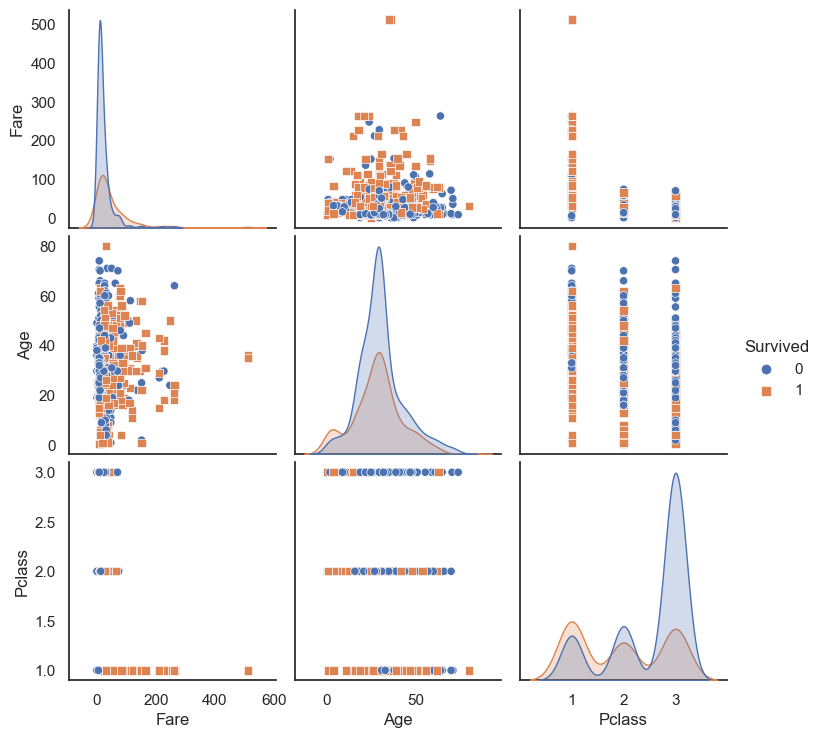

In [13]:
sns.pairplot(df_lbl[["Fare","Age","Pclass","Survived"]], vars = ["Fare","Age","Pclass"], hue="Survived", markers=["o", "s"])

Observation:
Age and Pclass are negatively correlated with Survived.
Fare is positively correlated with Survived.

In [14]:
Y = df_lbl.Survived # target variable 
Y.head()

0    0
1    1
2    1
3    1
4    0
Name: Survived, dtype: int64

In [15]:
X = df_lbl.drop(['Survived'], axis = 1)

In [16]:
X.head()

,Pclass,Sex,Age,Fare
0,3,1,22.0,7.2500
1,1,0,38.0,71.2833
2,3,0,26.0,7.9250
3,1,0,35.0,53.1000
4,3,1,35.0,8.0500


In [17]:
# Standardize data
mn = MinMaxScaler()
X[['Age', 'Fare']] = mn.fit_transform(X[['Age', 'Fare']])
X.head()

,Pclass,Sex,Age,Fare
0,3,1,0.271174,0.014151
1,1,0,0.472229,0.139136
2,3,0,0.321438,0.015469
3,1,0,0.434531,0.103644
4,3,1,0.434531,0.015713


In [18]:
# Splitting into train and test
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size = 0.2)
print(X_train.shape)
print(y_train.shape)

(712, 4)
(712,)


In [70]:
features = ["Pclass", "Age", "Fare", "Sex"]
target = "Survived"

model = DecisionTreeClassifier(random_state=1234)
fit = model.fit(X_train,y_train)

In [20]:
#import sys
#!{sys.executable} -m pip install pydotplus
#!{sys.executable} -m pip install Ipython

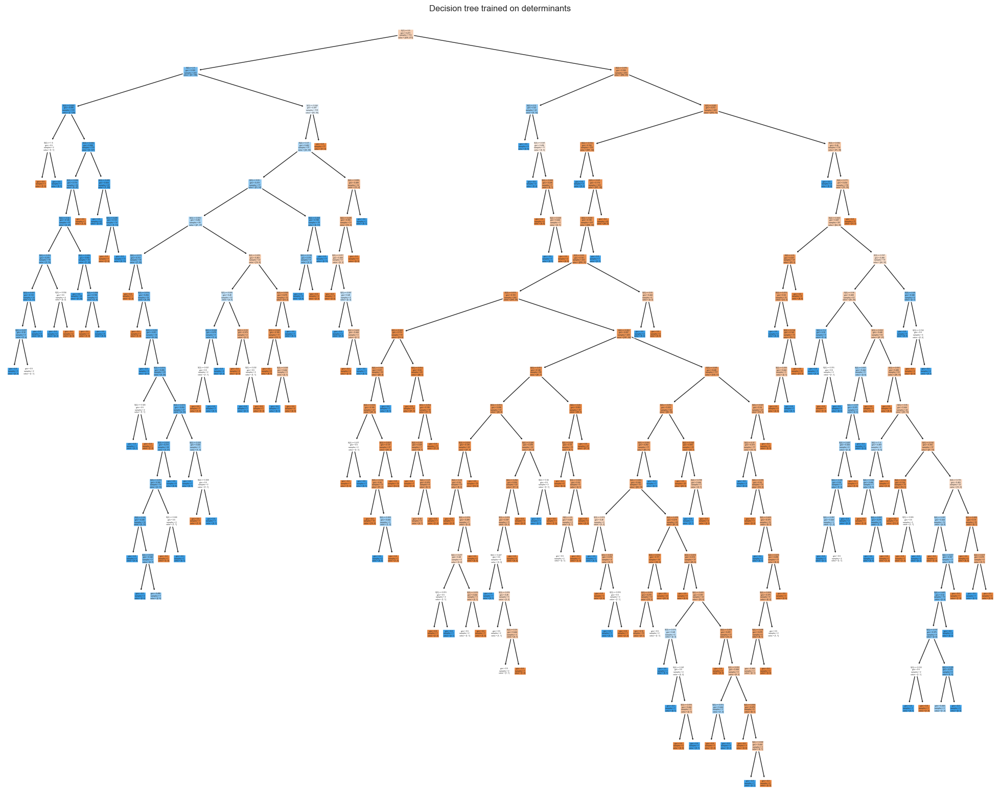

In [71]:
from sklearn.tree import plot_tree

fig = plt.figure(figsize=(25,20))
plot_tree(fit, filled=True)
plt.title("Decision tree trained on determinants")
plt.show()

In [22]:
#!pip install dtreeviz

In [23]:
#import os
#os.environ["PATH"] += os.pathsep + 'c:/users/mepra/.conda/envs/geo_env/lib/site-packages'

In [72]:
import dtreeviz # remember to load the package

viz_model = dtreeviz.model(model,
                           X_train= X_train, y_train = y_train,
                           feature_names= features,
                           target_name= target, class_names=["survive", "perish"])

In [73]:
viz_model.view(scale=0.8)

C:\Users\mepra\.conda\envs\geo_env\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


In [74]:
viz_model.view(orientation="LR")

In [75]:
x = X_train.iloc[100] #Prediction path explanations
x

Pclass    3.000000
Sex       1.000000
Age       0.359135
Fare      0.015713
Name: 90, dtype: float64

In [76]:
viz_model.view(x=x)

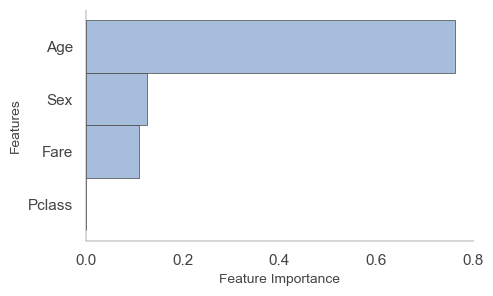

In [77]:
viz_model.instance_feature_importance(x, figsize=(5,3))

In [78]:
predict = model.predict(X_test)
predict

array([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0,
       1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1,
       1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0], dtype=int64)

In [79]:
from sklearn.metrics import confusion_matrix, accuracy_score

In [84]:
print("Accuracy score: {:.3f}".format(accuracy_score(y_test, predict)))

Accuracy score: 0.743


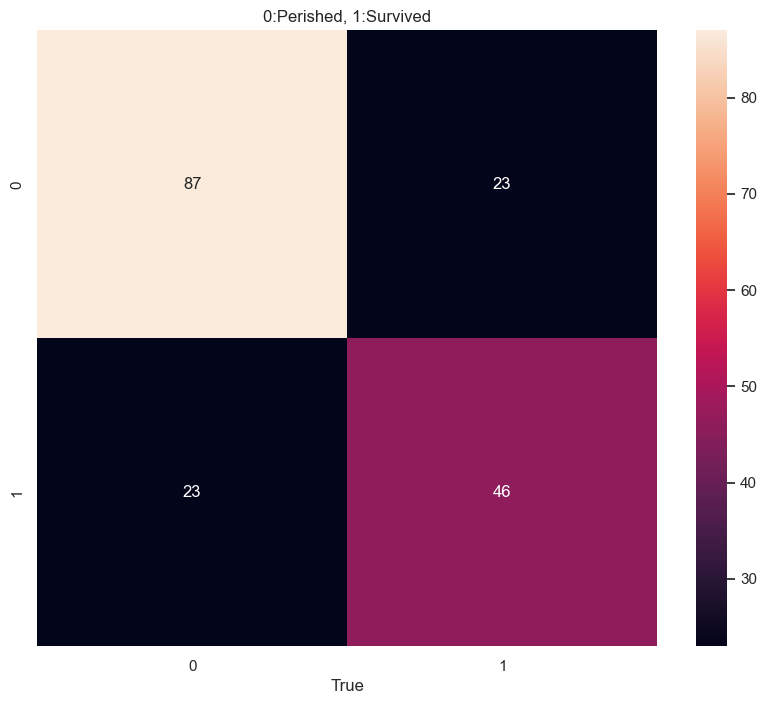

In [83]:
plt.figure(figsize=(8,5))
sns.heatmap(confusion_matrix(y_test, predict), annot=True)
plt.xlabel("True")
plt.title("0:Perish, 1:Survive")
plt.show()

In [98]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

model1 = DecisionTreeClassifier(random_state = 0)

tree_para = [{'criterion':['gini','entropy'],'max_depth': range(2,100),
                             'max_features': ['sqrt', 'log2', None] }]
                            
grid_search = GridSearchCV(model1,tree_para, cv=10, refit='AUC')
grid_search.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(random_state=0),
             param_grid=[{'criterion': ['gini', 'entropy'],
                          'max_depth': range(2, 100),
                          'max_features': ['sqrt', 'log2', None]}],
             refit='AUC')

In [99]:
predict2 = grid_search.predict(X_test)
predict2

array([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0,
       0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0,
       1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1,
       0, 0, 0], dtype=int64)

In [100]:
print("Accuracy score: {:.3f}".format(accuracy_score(y_test, predict2)))

Accuracy score: 0.743


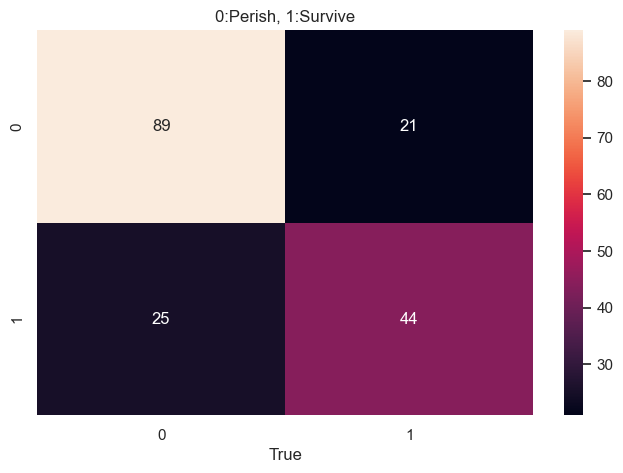

In [101]:
plt.figure(figsize=(8,5))
sns.heatmap(confusion_matrix(y_test, predict2), annot=True)
plt.xlabel("True")
plt.title("0:Perish, 1:Survive")
plt.show()